# This notebook relies on GoogleDrive content specific to our research and use cases. This file is being uploaded for documentation purposes only.

In [ ]:
import os
from google.colab import drive
import tensorflow as tf
import functools
import cv2
import matplotlib.pyplot as plt
import numpy as np
import pathlib
import random
print(tf.__version__)

2.8.0


In [ ]:
google_drive_path= '/content/drive/MyDrive/cats_and_cars/'

# Copied from Cats and Cars RMSE
if (os.path.ismount('/content/drive')):
  print('Drive is mounted!')
  !unzip "/content/drive/MyDrive/cats_and_cars/cats_and_cars_DS.zip" -d "/content" &> /dev/null # Glauco's Configuration
  #!unzip "/content/drive/MyDrive/cats_and_cars_DS.zip" -d "/content" &> /dev/null # Justin's Configuration
else:
  drive.mount('/content/drive', force_remount=True)
  !unzip "/content/drive/MyDrive/cats_and_cars/cats_and_cars_DS.zip" -d "/content" &> /dev/null # Glauco's Configuration
  #!unzip "/content/drive/MyDrive/cats_and_cars_DS.zip" -d "/content" &> /dev/null # Justin's Configuration

Mounted at /content/drive


In [ ]:
# Remove the cars folder from the drive content, free up space
! rm -rf /content/cats_and_cars/cars

In [ ]:
print('Loading cats and cars...')
path_cats = '/content/cats_and_cars/'


batch_size = 32

#### Augmented Generators ####
# Create the training and validation generators
image_gen =  tf.keras.preprocessing.image.ImageDataGenerator(
    #rotation_range = 25,
    #width_shift_range = 0.15,
    #height_shift_range = 0.15,
    #shear_range = 0.15,
    #zoom_range = 0.15,
    rescale = 1/255.0,
    #horizontal_flip=True,
    #vertical_flip=True,
    brightness_range=[0.8,1.2],
    validation_split= 0.25,
    fill_mode = 'bicubic')

# initialize the training generator
trainGen = image_gen.flow_from_directory(
    path_cats,
    class_mode="input",
    classes=None,
    target_size=(64, 64),
    color_mode="rgb",
    shuffle=True,
    batch_size=batch_size,
    subset='training')
# initialize the validation generator

valGen = image_gen.flow_from_directory(
    path_cats,
    class_mode="input",
    classes=None,
    target_size=(64, 64),
    color_mode="rgb",
    shuffle=False,
    batch_size=batch_size,
    subset='validation')

Loading cats and cars...
Found 22383 images belonging to 1 classes.
Found 7460 images belonging to 1 classes.


In [ ]:
#### Unaltered Generators ####
# Create the training and validation generators
unimage_gen =  tf.keras.preprocessing.image.ImageDataGenerator(
    rescale = 1/255.0,
    validation_split= 0.25,
    fill_mode = 'nearest')

# initialize the training generator
untrainGen = image_gen.flow_from_directory(
    path_cats,
    class_mode="input",
    classes=None,
    target_size=(64, 64),
    color_mode="rgb",
    shuffle=True,
    batch_size=batch_size,
    subset='training')
# initialize the validation generator

unvalGen = image_gen.flow_from_directory(
    path_cats,
    class_mode="input",
    classes=None,
    target_size=(64, 64),
    color_mode="rgb",
    shuffle=False,
    batch_size=batch_size,
    subset='validation')

Found 22383 images belonging to 1 classes.
Found 7460 images belonging to 1 classes.


In [ ]:
filt = 6
latent_space = 512
input_shape = (64, 64, 3)

Conv2D = functools.partial(tf.keras.layers.Conv2D, padding='same', activation='relu')
BatchNormalization = tf.keras.layers.BatchNormalization
Flatten = tf.keras.layers.Flatten
DenseS = functools.partial(tf.keras.layers.Dense, activation='sigmoid')
DenseR = functools.partial(tf.keras.layers.Dense, activation=tf.keras.activations.elu)
Conv2DTranspose = functools.partial(tf.keras.layers.Conv2DTranspose, padding='same', activation=tf.keras.activations.elu)
Reshape = tf.keras.layers.Reshape
Dropout = tf.keras.layers.Dropout

kernelSize = (3,3)
ae_cats = tf.keras.models.Sequential([
                            Conv2D(filters=filt, kernel_size=kernelSize,
                                  input_shape = input_shape),
                            Conv2D(filters=2*filt, kernel_size=kernelSize,
                            strides=2),
                            Conv2D(filters=4*filt, kernel_size=kernelSize,
                              ),
                            Conv2D(filters=8*filt, kernel_size=kernelSize,
                              strides=2),
                            Flatten(),
                            DenseR(4096),
                            BatchNormalization(),
                            Dropout(0.2),
                            DenseR(1048),
                            BatchNormalization(),
                            Dropout(0.2),
                            DenseR(latent_space),
                            tf.keras.layers.Normalization(axis=None), # Normalize at the latent layer
                            Dropout(0.2),
                            DenseR(1048),
                            BatchNormalization(),
                            Dropout(0.2),
                            DenseR(4096),
                            BatchNormalization(),
                            Dropout(0.2),
                            DenseR(12288),
                            Reshape(target_shape=(16,16,48)),
                            Conv2DTranspose(filters=8*filt, kernel_size=kernelSize, 
                                            strides=2),
                            Conv2DTranspose(filters=4*filt, kernel_size=kernelSize),
                            Conv2DTranspose(filters=2*filt, kernel_size=kernelSize, 
                                            strides=2),
                            Conv2DTranspose(filters=3, kernel_size=kernelSize)
])

ae_cats.summary()

ae_cats_unaltered = tf.keras.models.clone_model(ae_cats)

# Plot the classifier model to a .png file 
tf.keras.utils.plot_model (ae_cats, to_file = 'autoencoder_structure.png', 
                           show_shapes = True)

# Compile the model using adam optimizer.
ae_cats.compile(loss = 'MSE', optimizer = 'adam',
                metrics = ['accuracy'])

# Compile the model using adam optimizer.
ae_cats_unaltered.compile(loss = 'MSE', optimizer = 'adam',
                          metrics = ['accuracy'])

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 64, 64, 6)         168       
                                                                 
 conv2d_1 (Conv2D)           (None, 32, 32, 12)        660       
                                                                 
 conv2d_2 (Conv2D)           (None, 32, 32, 24)        2616      
                                                                 
 conv2d_3 (Conv2D)           (None, 16, 16, 48)        10416     
                                                                 
 flatten (Flatten)           (None, 12288)             0         
                                                                 
 dense (Dense)               (None, 4096)              50335744  
                                                                 
 batch_normalization (BatchN  (None, 4096)             1

In [ ]:
EPOCHS = 100

callbacks = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss', patience=10, mode='auto')
                              
ae_history = ae_cats.fit(x = trainGen,
                       epochs = EPOCHS,
                       validation_data = valGen,
                       verbose = True,
                       callbacks = [callbacks])

ae_cats.save("Autoencoder_Model.h5")

Epoch 1/100
700/700 [==============================] - 40s 41ms/step - loss: 0.0318 - accuracy: 0.6313 - val_loss: 0.0274 - val_accuracy: 0.7310
Epoch 2/100
700/700 [==============================] - 28s 40ms/step - loss: 0.0233 - accuracy: 0.6820 - val_loss: 0.0239 - val_accuracy: 0.4916
Epoch 3/100
700/700 [==============================] - 28s 40ms/step - loss: 0.0218 - accuracy: 0.6978 - val_loss: 0.0236 - val_accuracy: 0.5972
Epoch 4/100
700/700 [==============================] - 28s 40ms/step - loss: 0.0209 - accuracy: 0.7078 - val_loss: 0.0208 - val_accuracy: 0.7183
Epoch 5/100
700/700 [==============================] - 28s 40ms/step - loss: 0.0203 - accuracy: 0.7138 - val_loss: 0.0192 - val_accuracy: 0.7671
Epoch 6/100
700/700 [==============================] - 28s 41ms/step - loss: 0.0197 - accuracy: 0.7216 - val_loss: 0.0196 - val_accuracy: 0.7537
Epoch 7/100
700/700 [==============================] - 28s 40ms/step - loss: 0.0194 - accuracy: 0.7250 - val_loss: 0.0165 - val_ac

In [ ]:
unae_history = ae_cats_unaltered.fit(x = untrainGen,
                       epochs = EPOCHS,
                       validation_data = unvalGen,
                       verbose = True,
                       callbacks = [callbacks])

ae_cats_unaltered.save("unAutoencoder_Model.h5")

Epoch 1/100
700/700 [==============================] - 31s 42ms/step - loss: 0.0316 - accuracy: 0.6282 - val_loss: 0.0258 - val_accuracy: 0.6616
Epoch 2/100
700/700 [==============================] - 29s 42ms/step - loss: 0.0227 - accuracy: 0.6836 - val_loss: 0.0189 - val_accuracy: 0.6671
Epoch 3/100
700/700 [==============================] - 30s 42ms/step - loss: 0.0215 - accuracy: 0.7033 - val_loss: 0.0226 - val_accuracy: 0.7103
Epoch 4/100
700/700 [==============================] - 29s 42ms/step - loss: 0.0205 - accuracy: 0.7122 - val_loss: 0.0243 - val_accuracy: 0.4727
Epoch 5/100
700/700 [==============================] - 34s 48ms/step - loss: 0.0196 - accuracy: 0.7199 - val_loss: 0.0186 - val_accuracy: 0.6888
Epoch 6/100
700/700 [==============================] - 30s 42ms/step - loss: 0.0189 - accuracy: 0.7281 - val_loss: 0.0241 - val_accuracy: 0.5602
Epoch 7/100
700/700 [==============================] - 29s 42ms/step - loss: 0.0184 - accuracy: 0.7324 - val_loss: 0.0167 - val_ac

In [ ]:
def image_rmse_calc(primary_image, secondary_image, is_color=False):
    """
    This function calculates the Root Mean Squared Error between two input images. This function is desgined to use
    either grayscale or color images (RGB format). The images are assumed to be in channel last format.

    :param primary_image: The first image in the RMSE calculation.
    :param secondary_image: The second image in the RMSE calculation.
    :param is_color: A boolean indicating whether the image is in color
    :return: The RMSE value(s) calculated between the primary and secondary images.
    """

    error = 0
    image_length = primary_image.shape[0]
    image_width = primary_image.shape[1]

    if is_color:
        num_channels = primary_image.shape[-1]  # Get number of channels
        image_length = primary_image.shape[0]
        image_width = primary_image.shape[1]
        for i in range(num_channels):
            error += np.sqrt(
                np.sum(
                    (primary_image[:, :, i].astype('float')
                     - secondary_image[:, :, i].astype('float')
                     ) ** 2)
                / (image_width * image_length))
    else:
        error = np.sqrt(
            np.sum(
                (primary_image[:, :].astype('float')
                 - secondary_image[:, :].astype('float')
                 ) ** 2)
            / (image_width * image_length)
        )

    return error

In [ ]:
def normalize_tensor(tensor, min=0.0, max=1.0):
  tensor = tf.divide(
    tf.subtract(
        tensor, 
        tf.reduce_min(tensor)
    ), 
    tf.subtract(
        tf.reduce_max(tensor), 
        tf.reduce_min(tensor)
    )
  )
  return tensor

# select transformation function
transformation_function = normalize_tensor

In [ ]:
def limit_cycle_cats_unaltered(rmse_threshold):
  n_im = 10
  idx=0
  seed = unvalGen.next()
  seed = seed[1]
  results = []
  rs = []
  for imn in range(n_im):
    ims1 = np.expand_dims(seed[imn], axis=0)
    ims2 = ae_cats_unaltered(ims1)
    ims2 = transformation_function(ims2)
    r = image_rmse_calc(ims1[0], ims2[0], is_color=True)
    rs.append([r])
    i=1
    while r > rmse_threshold:
      i = i+1
      ims1 = ims2
      ims2 = ae_cats_unaltered(ims1)
      ims2 = transformation_function(ims2)
      r = image_rmse_calc(ims1[0], ims2[0], is_color=True)
      rs[imn].append(r)
      #if i%100 == 0:
      #  print(i)
      if i>1000:
        break

    results.append([ims1[0], ims2[0], i])
    #print("# of iterations:", i, "; rmse:", r)
    plt.plot(rs[imn])
    
  plt.show()

  n_im_show = 10
  plt.figure(figsize=(n_im_show*2,8))
  for i in range(n_im_show) :   
      plt.subplot(1,n_im_show,(i+1))
      plt.imshow(seed[i])
  plt.title('seed')
  plt.show()
  plt.figure(figsize=(n_im_show*2,8))
  for i in range(n_im_show) :   
      plt.subplot(1,n_im_show,(i+1))
      plt.imshow(results[i][0])
  plt.title('before last')
  plt.show()
  plt.figure(figsize=(n_im_show*2,8))
  for i in range(n_im_show) :   
    plt.subplot(1,n_im_show,(i+1))
    plt.imshow(results[i][1])
    plt.title("Iter: %i" % results[i][2])
  plt.show()
  # visualize difference
  plt.figure(figsize=(n_im_show*2,8))
  for i in range(n_im_show) :   
      plt.subplot(1,n_im_show,(i+1))
      image = 0.5 + results[i][0]-results[i][1]
      plt.imshow(image, vmin=image.min(), vmax=image.max())
  plt.title('difference')
  plt.show()

Simple limit cycle (only cats AE) with threshold RMSE: 0.2


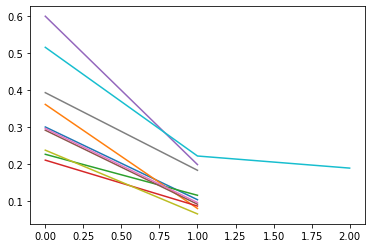

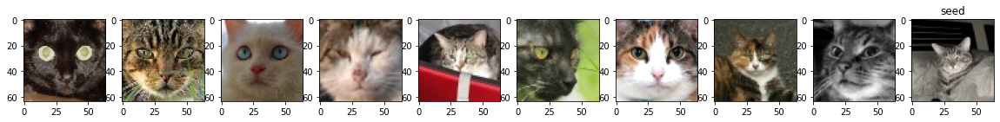

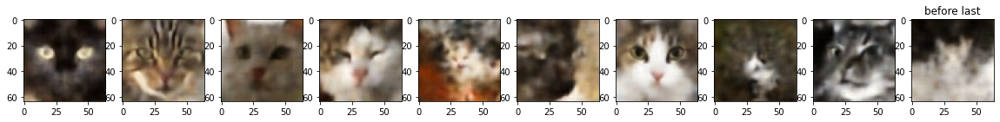

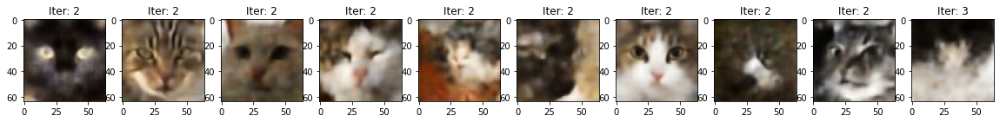

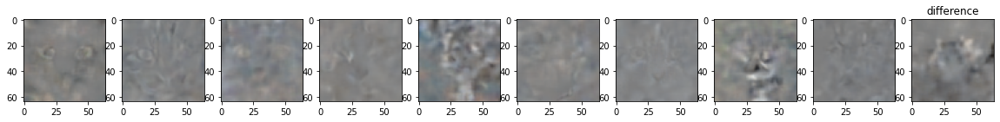

Simple limit cycle (only cats AE) with threshold RMSE: 0.15000000000000002


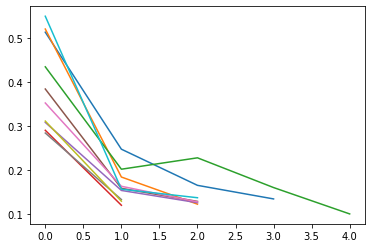

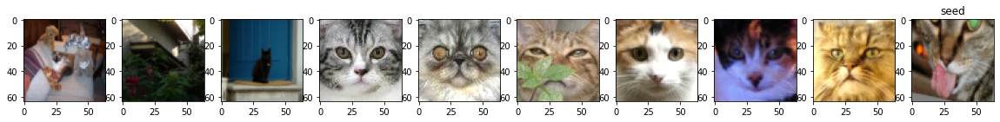

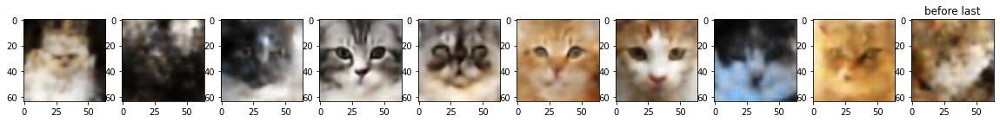

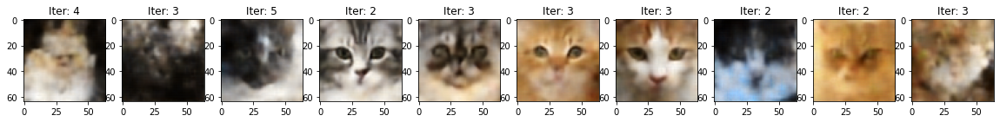

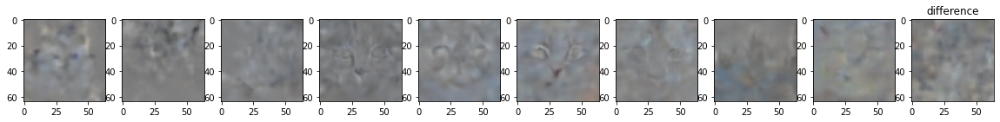

Simple limit cycle (only cats AE) with threshold RMSE: 0.10000000000000003


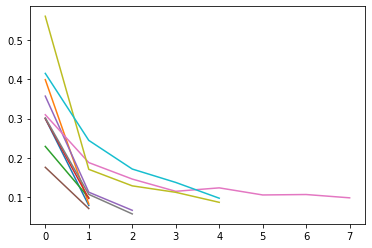

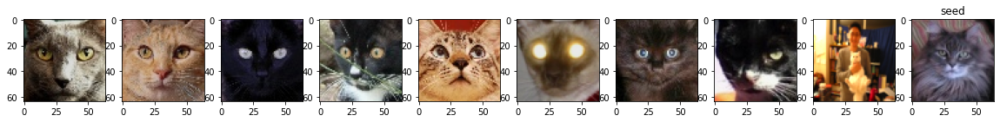

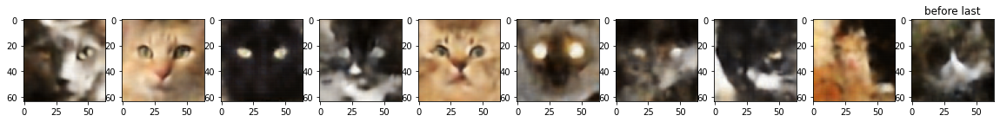

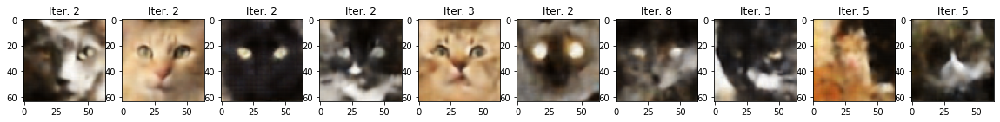

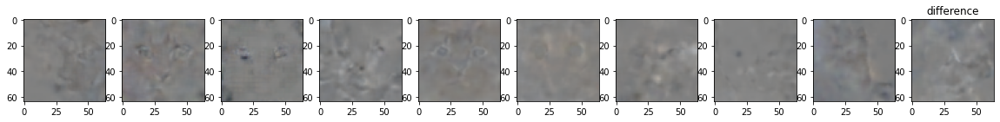

Simple limit cycle (only cats AE) with threshold RMSE: 0.050000000000000044


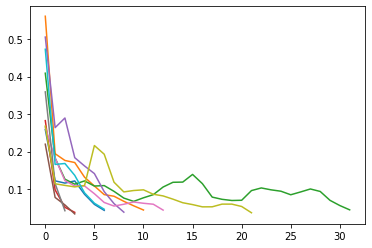

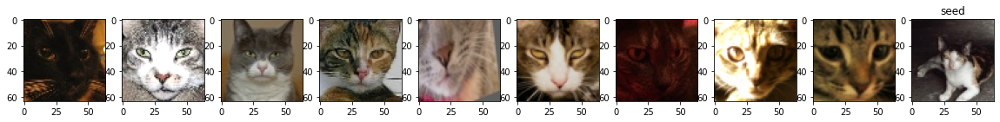

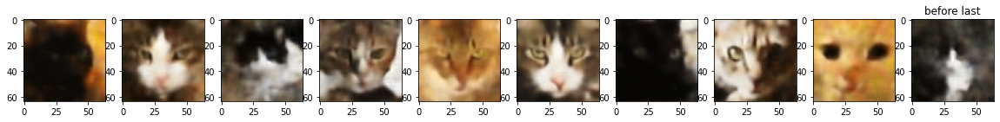

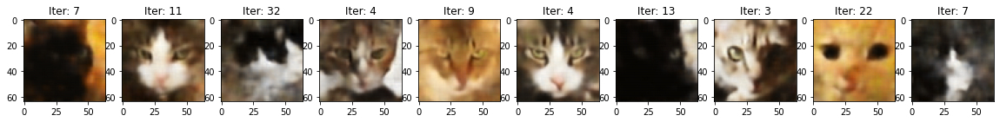

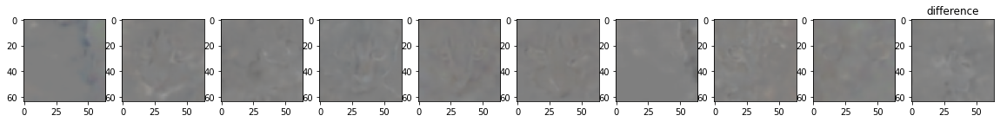

Simple limit cycle (only cats AE) with threshold RMSE: 5.551115123125783e-17


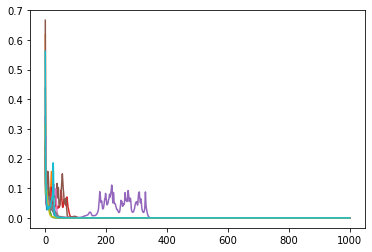

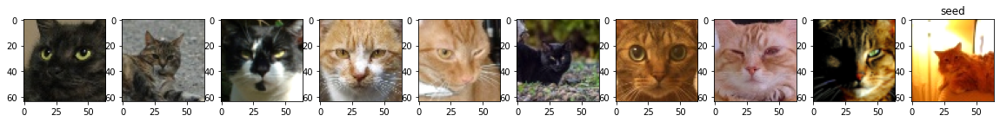

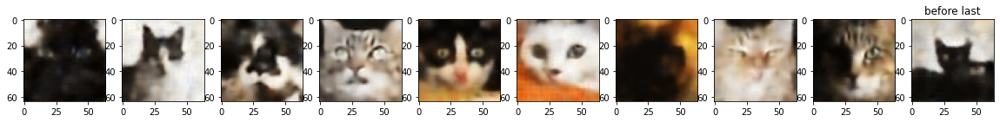

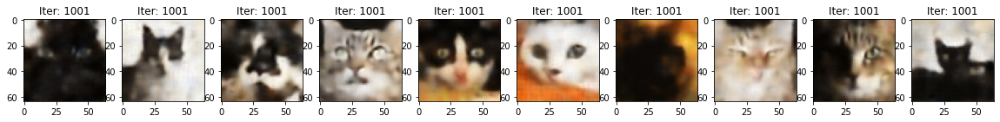

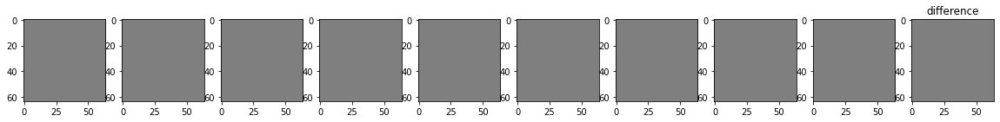

In [ ]:
from tensorflow.python.ops.numpy_ops import np_config
np_config.enable_numpy_behavior()
for threshold in np.arange(0.20, -0.01, -0.05):
  print("Simple limit cycle (only cats AE) with threshold RMSE:", threshold)
  limit_cycle_cats_unaltered(threshold)

In [ ]:
def limit_cycle_cats(rmse_threshold):
  n_im = 10
  idx=0
  seed = valGen.next()
  seed = seed[1]
  results = []
  rs = []
  for imn in range(n_im):
    ims1 = np.expand_dims(seed[imn], axis=0)
    ims2 = ae_cats(ims1)
    ims2 = transformation_function(ims2)
    r = image_rmse_calc(ims1[0], ims2[0], is_color=True)
    rs.append([r])
    i=1
    while r > rmse_threshold:
      i = i+1
      ims1 = ims2
      ims2 = ae_cats(ims1)
      ims2 = transformation_function(ims2)
      r = image_rmse_calc(ims1[0], ims2[0], is_color=True)
      rs[imn].append(r)
      #if i%100 == 0:
      #  print(i)
      if i>1000:
        break

    results.append([ims1[0], ims2[0], i])
    #print("# of iterations:", i, "; rmse:", r)
    plt.plot(rs[imn])
    
  plt.show()

  n_im_show = 10
  plt.figure(figsize=(n_im_show*2,8))
  for i in range(n_im_show) :   
      plt.subplot(1,n_im_show,(i+1))
      plt.imshow(seed[i])
  plt.title('seed')
  plt.show()
  plt.figure(figsize=(n_im_show*2,8))
  for i in range(n_im_show) :   
      plt.subplot(1,n_im_show,(i+1))
      plt.imshow(results[i][0])
  plt.title('before last')
  plt.show()
  plt.figure(figsize=(n_im_show*2,8))
  for i in range(n_im_show) :   
    plt.subplot(1,n_im_show,(i+1))
    plt.imshow(results[i][1])
    plt.title("Iter: %i" % results[i][2])
  plt.show()
  # visualize difference
  plt.figure(figsize=(n_im_show*2,8))
  for i in range(n_im_show) :   
      plt.subplot(1,n_im_show,(i+1))
      image = 0.5 + results[i][0]-results[i][1]
      plt.imshow(image, vmin=image.min(), vmax=image.max())
  plt.title('difference')
  plt.show()

Simple limit cycle (only cats AE) with threshold RMSE: 0.2


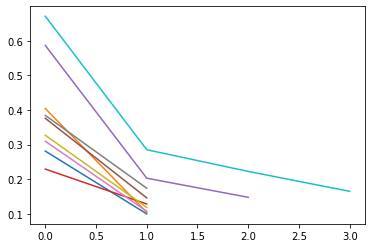

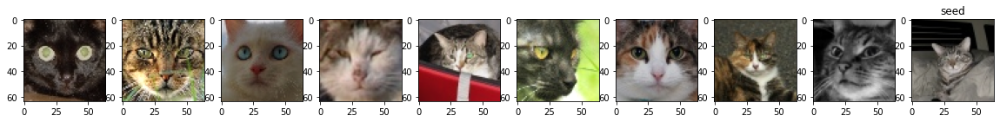

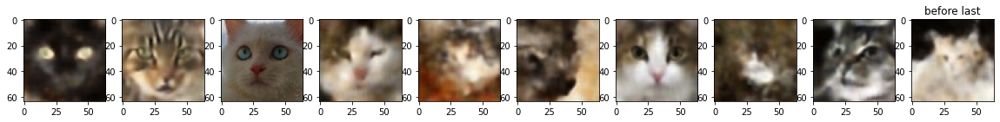

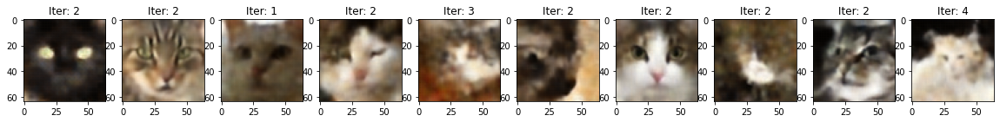

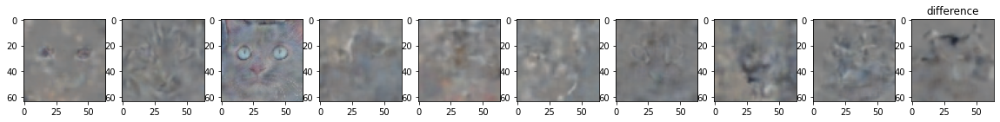

Simple limit cycle (only cats AE) with threshold RMSE: 0.15000000000000002


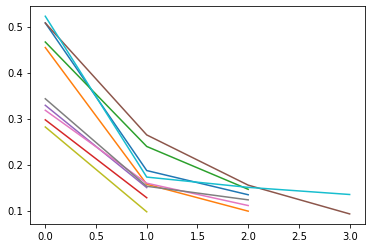

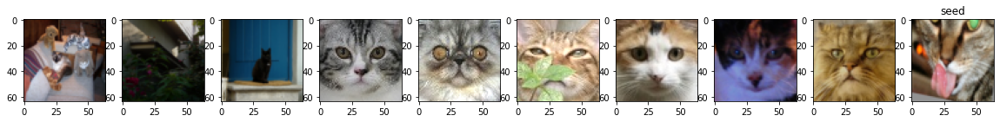

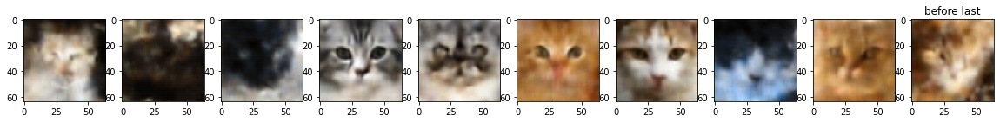

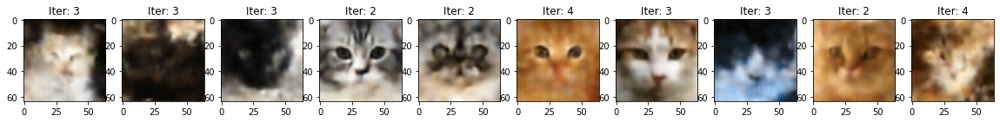

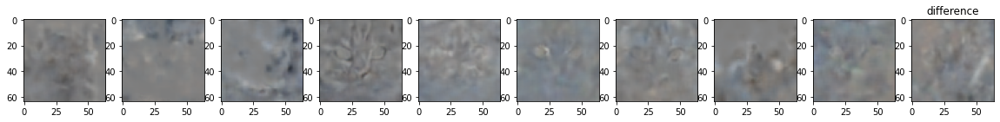

Simple limit cycle (only cats AE) with threshold RMSE: 0.10000000000000003


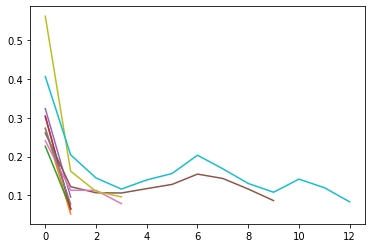

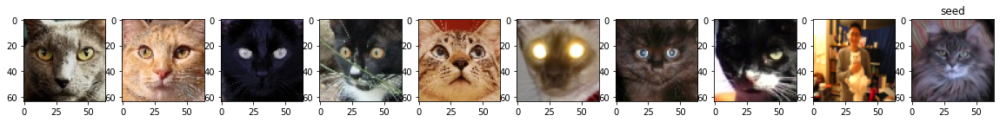

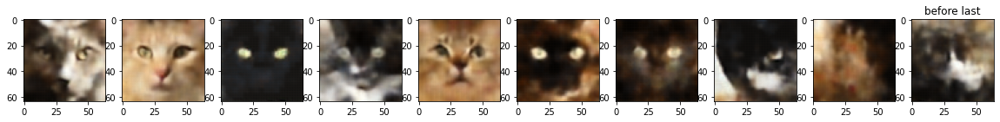

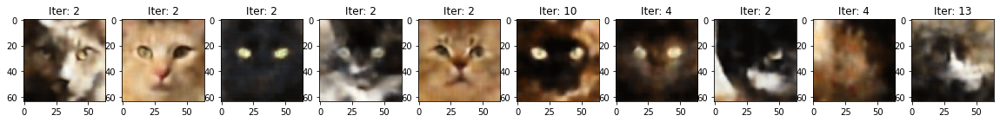

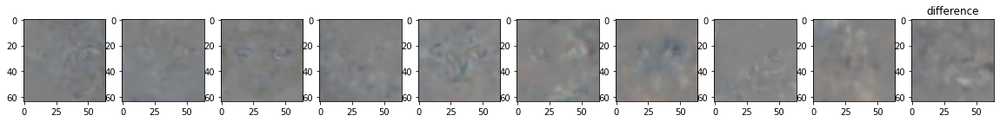

Simple limit cycle (only cats AE) with threshold RMSE: 0.050000000000000044


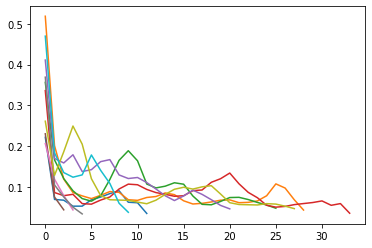

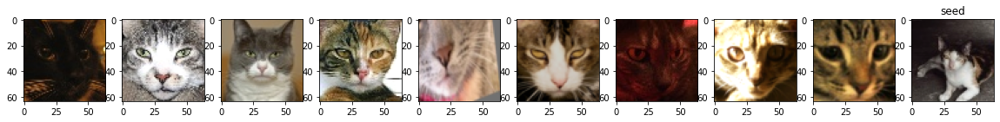

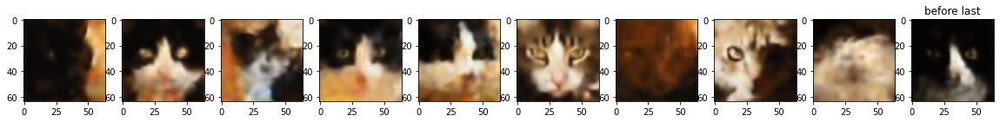

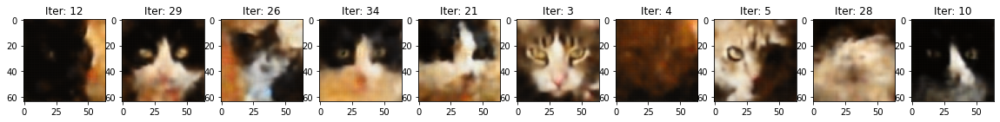

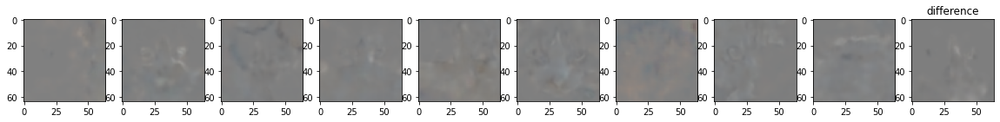

Simple limit cycle (only cats AE) with threshold RMSE: 5.551115123125783e-17


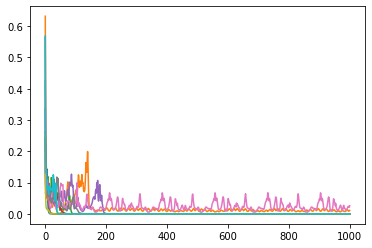

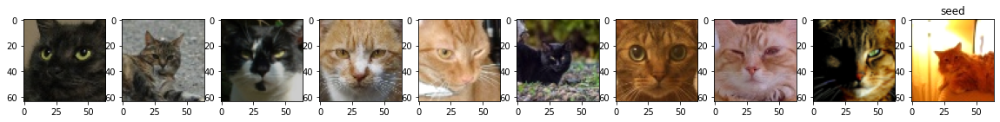

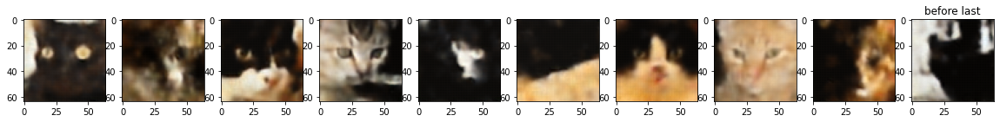

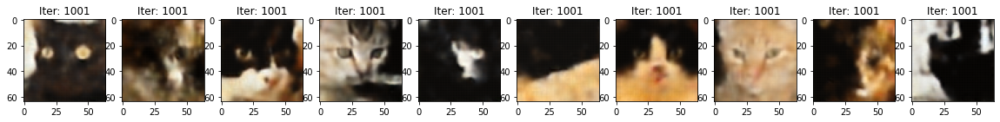

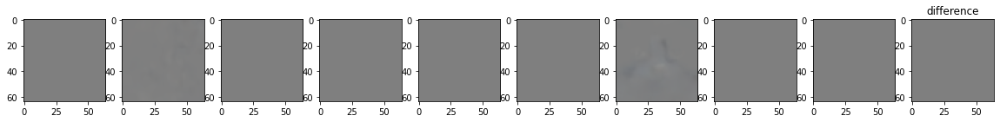

In [ ]:
from tensorflow.python.ops.numpy_ops import np_config
np_config.enable_numpy_behavior()
for threshold in np.arange(0.20, -0.01, -0.05):
  print("Simple limit cycle (only cats AE) with threshold RMSE:", threshold)
  limit_cycle_cats(threshold)

In [ ]:
def double_limit_cycle(threshold):
  n_im = 10
  idx=0
  seed = unvalGen.next()
  seed = seed[1]
  results = []
  rs = []
  for imn in range(n_im):
    ims1 = np.expand_dims(seed[imn], axis=0)
    ims2 = ae_cats_unaltered(ims1)
    ims2 = transformation_function(ims2)
    ims2 = ae_cats(ims2)
    ims2 = transformation_function(ims2)
    r = image_rmse_calc(ims1[0], ims2[0], is_color=True)
    rs.append([r])
    i=1
    while r > threshold:
      i = i+1
      ims1 = ims2
      ims2 = ae_cats_unaltered(ims1)
      ims2 = transformation_function(ims2)
      ims2 = ae_cats(ims2)
      ims2 = transformation_function(ims2)
      r = image_rmse_calc(ims1[0], ims2[0], is_color=True)
      rs[imn].append(r)
      #if i%100 == 0:
        #print(i)
      if i>1000:
        break

    results.append([ims1[0], ims2[0], i])
    #print("# of iterations:", i, "; rmse:", r)
    plt.plot(rs[imn])
    
  plt.show()

  n_im_show = 10
  plt.figure(figsize=(n_im_show*2,8))
  for i in range(n_im_show) :   
      plt.subplot(1,n_im_show,(i+1))
      plt.imshow(seed[i])
  plt.title('seed')
  plt.show()
  plt.figure(figsize=(n_im_show*2,8))
  for i in range(n_im_show) :   
      plt.subplot(1,n_im_show,(i+1))
      plt.imshow(results[i][0])
  plt.title('before last')
  plt.show()
  plt.figure(figsize=(n_im_show*2,8))
  for i in range(n_im_show) :   
    plt.subplot(1,n_im_show,(i+1))
    plt.imshow(results[i][1])
    plt.title("Iter: %i" % results[i][2])
  plt.show()
  # visualize difference
  plt.figure(figsize=(n_im_show*2,8))
  for i in range(n_im_show) :   
      plt.subplot(1,n_im_show,(i+1))
      image = 0.5 + results[i][0]-results[i][1]
      plt.imshow(image, vmin=image.min(), vmax=image.max())
  plt.title('difference')
  plt.show()

Double limit cycle (cats and augmented cats) with threshold RMSE: 0.25


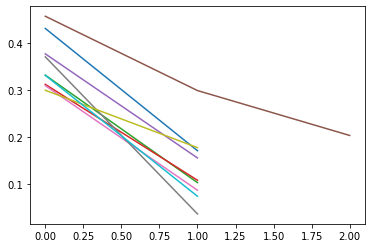

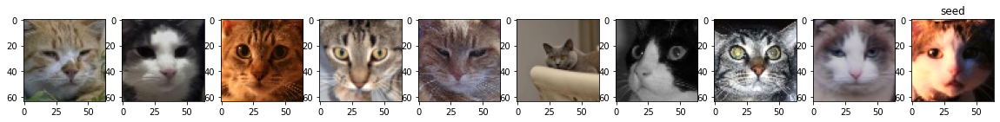

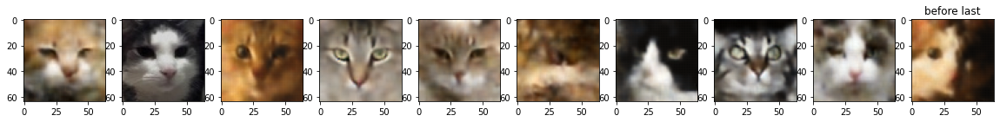

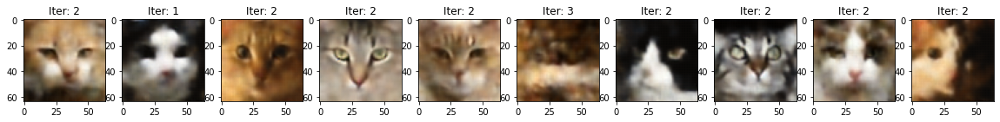

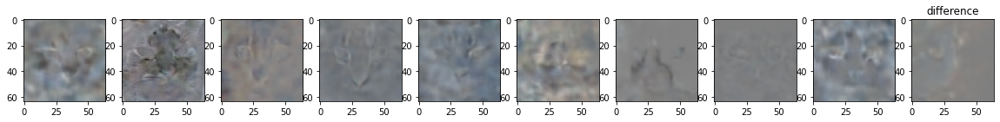

Double limit cycle (cats and augmented cats) with threshold RMSE: 0.2


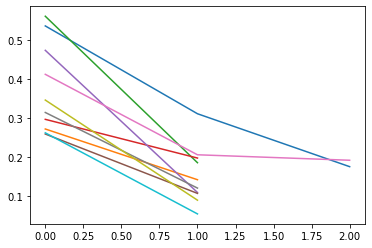

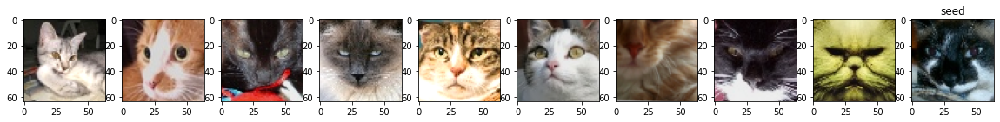

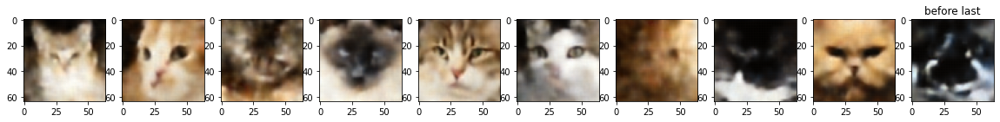

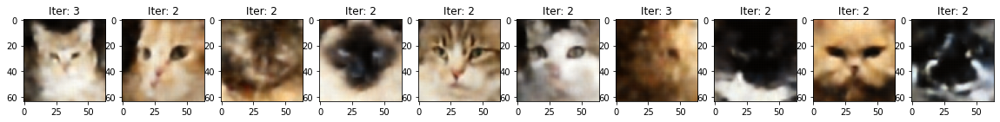

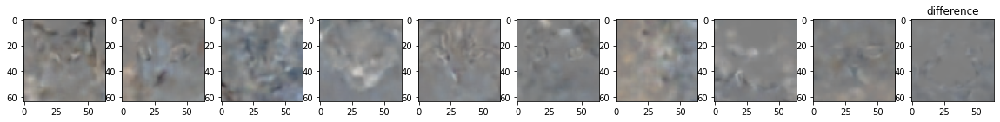

Double limit cycle (cats and augmented cats) with threshold RMSE: 0.15000000000000002


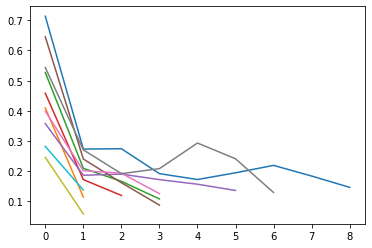

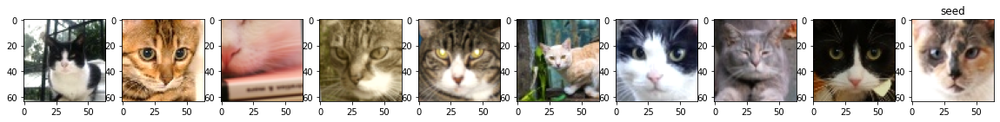

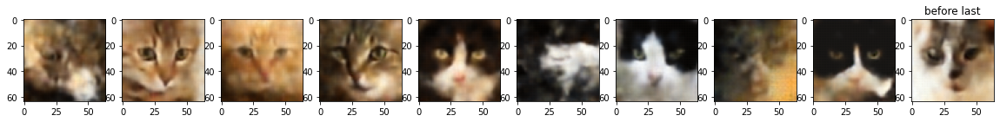

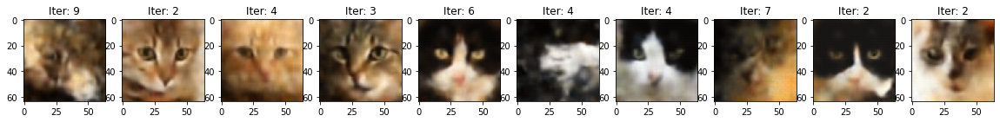

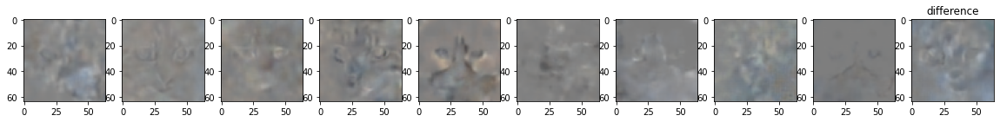

Double limit cycle (cats and augmented cats) with threshold RMSE: 0.10000000000000003


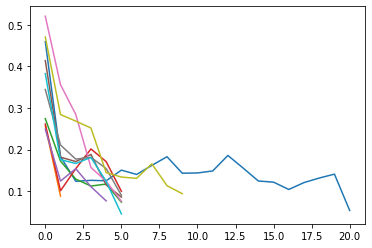

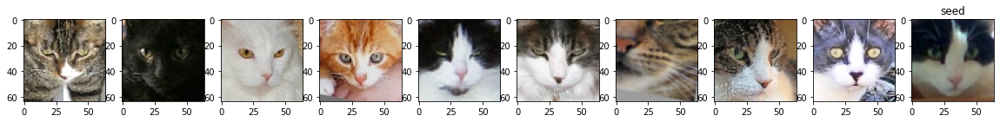

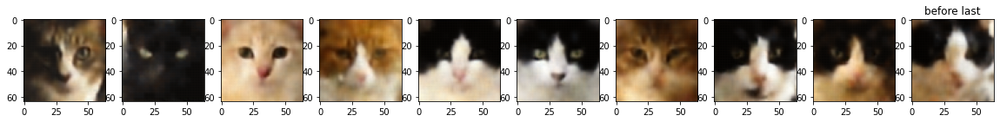

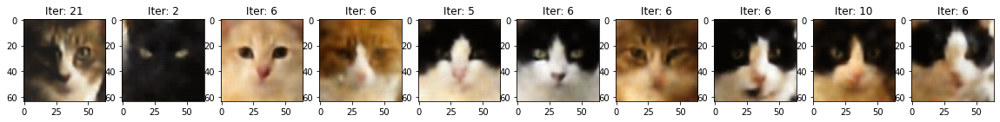

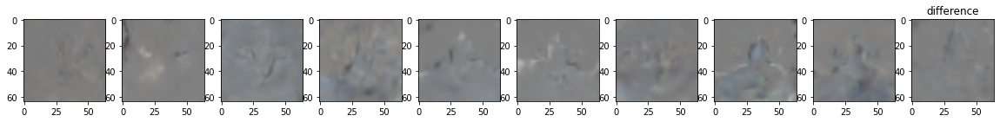

Double limit cycle (cats and augmented cats) with threshold RMSE: 0.050000000000000044


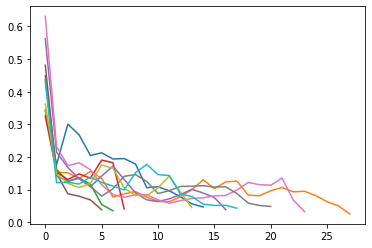

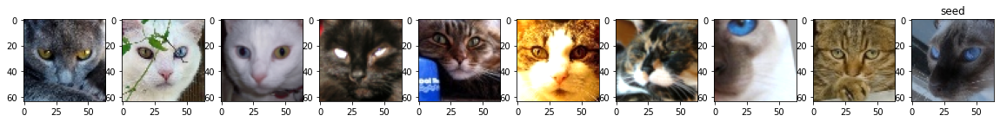

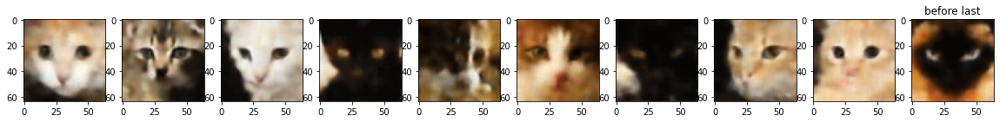

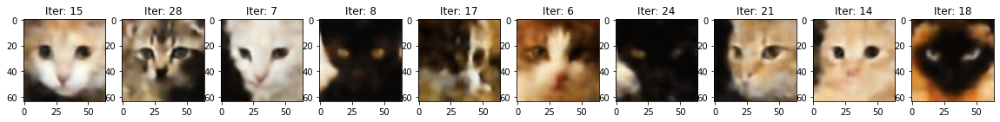

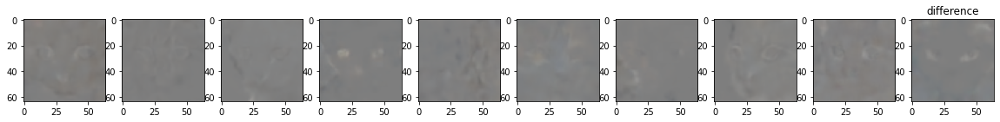

Double limit cycle (cats and augmented cats) with threshold RMSE: 5.551115123125783e-17


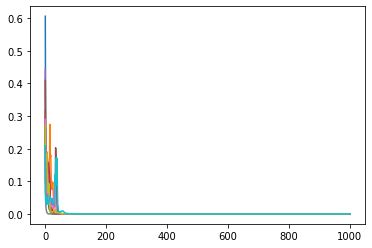

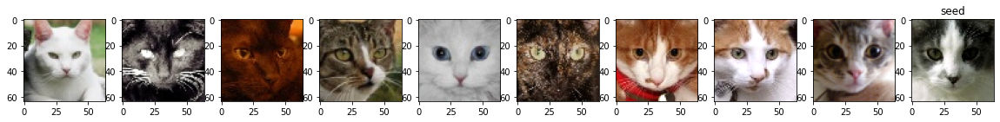

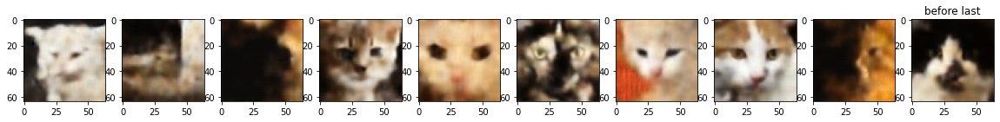

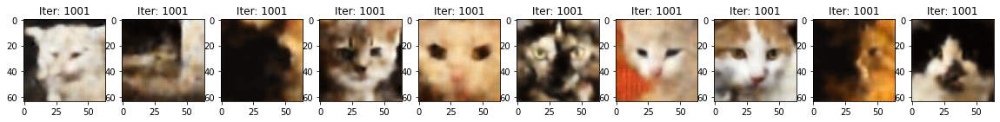

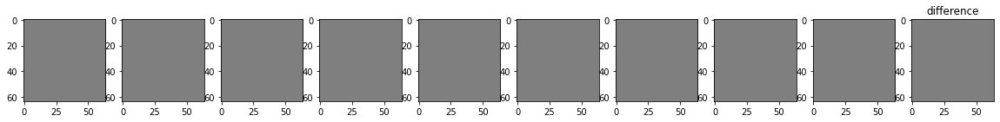

In [ ]:
for threshold in np.arange(0.25, -0.01, -0.05):
  print("Double limit cycle (cats and augmented cats) with threshold RMSE:", threshold)
  double_limit_cycle(threshold)